In [8]:
# reload all modules (including segment.py) on every execution
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
import sys, os
sys.path.insert(0, os.path.join(os.getcwd(), "..", "scripts"))

import numpy as np
from PIL import Image
from scipy.ndimage import center_of_mass

from segment import app, segment, crop_image, plot_overlay_image, process_sample

## Config

In [10]:
sample_path = r"Q:\mark_sheinin_lab\DATA\experiment-10\gun_1000--30-03-14-16-10"

OBJECT = "gun"
LEFT, RIGHT, UP, DOWN = 0.15, 0.67, 0.08, 0.7

## Stage 1 — Raw image

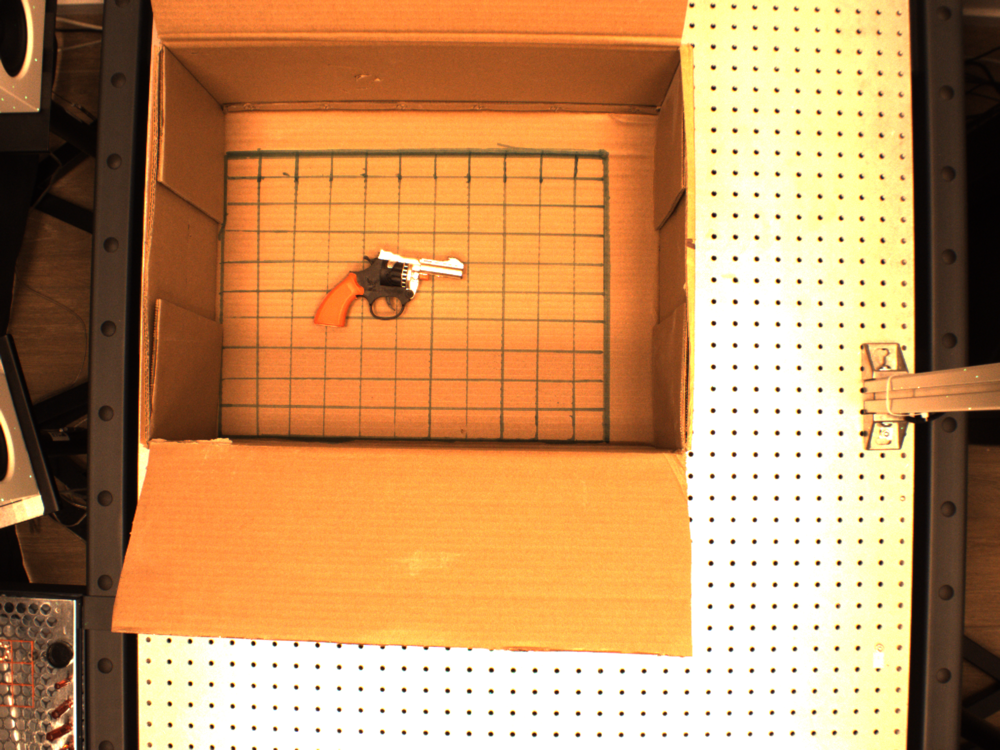

In [11]:
raw_image = Image.open(os.path.join(sample_path, "box_overhead_image.png"))
raw_image

## Stage 2 — Cropped image

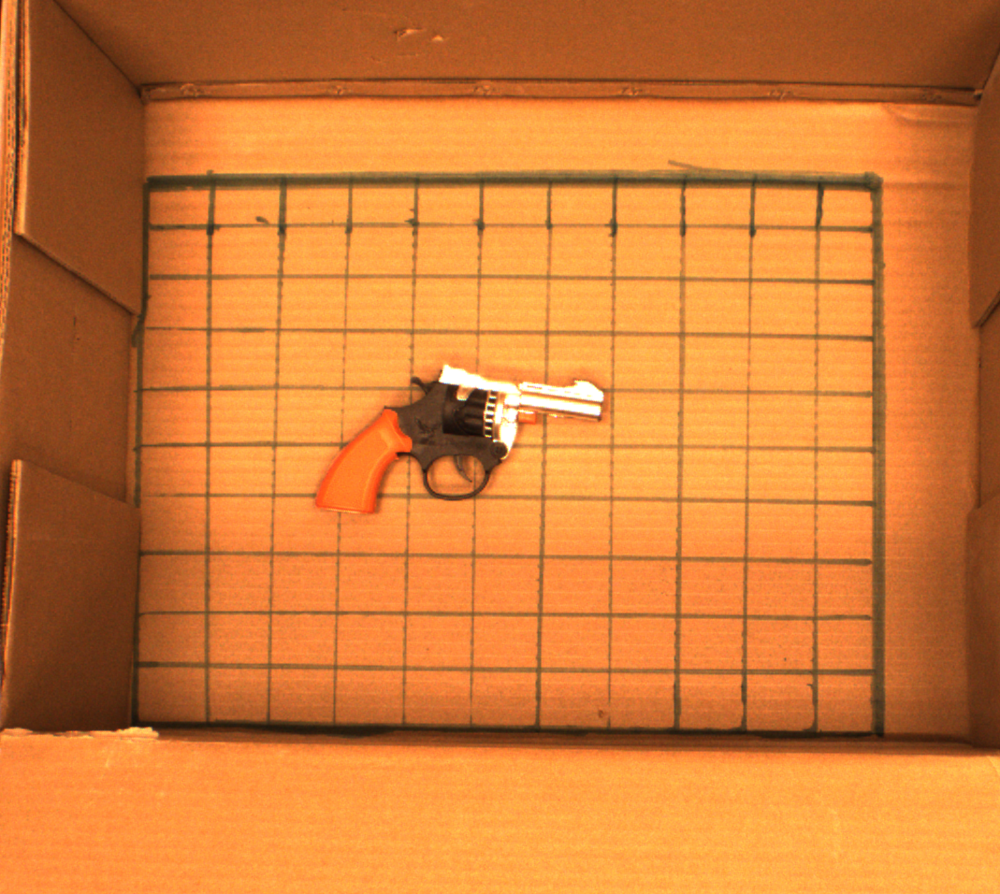

In [12]:
cropped_image = crop_image(raw_image, left=LEFT, right=RIGHT, up=UP, down=DOWN)
cropped_image

## Stage 3 — Segmentation mask

In [13]:
with app.run():
    mask, overlay = segment.remote(np.array(cropped_image), OBJECT)

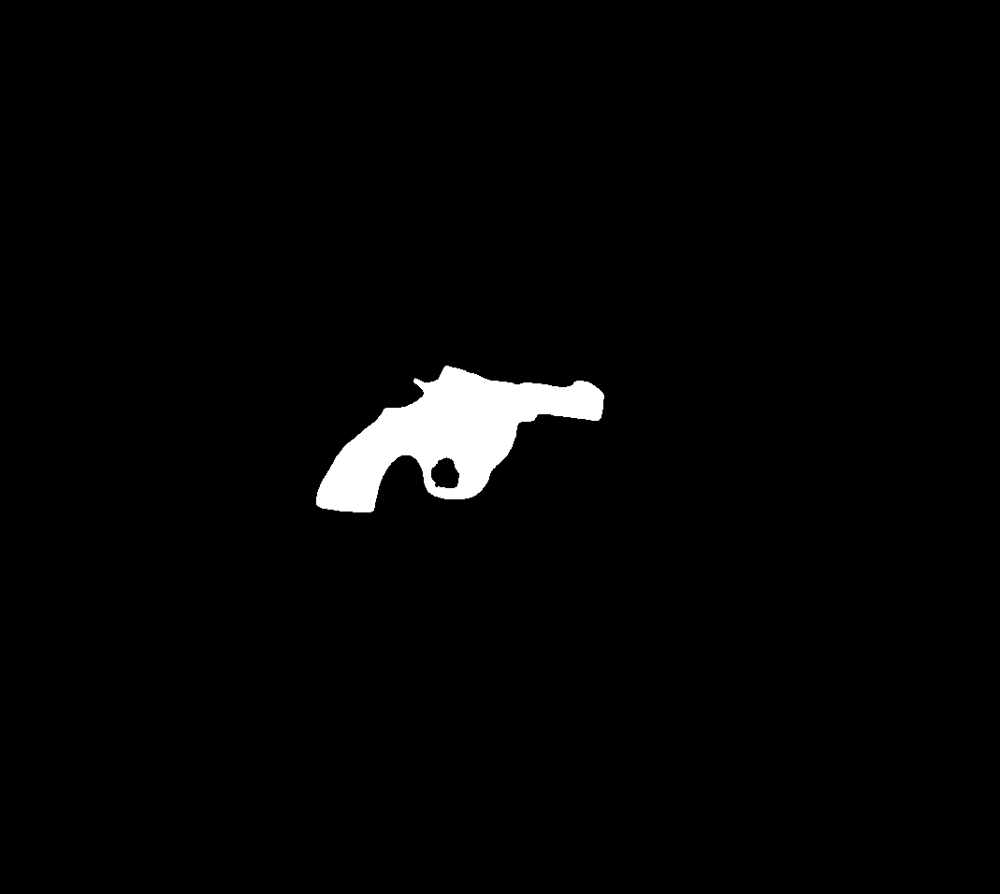

In [14]:
Image.fromarray(mask)

## Stage 4 — Position + overlay

In [15]:
y_pos, x_pos = center_of_mass(mask)
print(f"{x_pos=}\n{y_pos=}")

x_pos=479.5849301721338
y_pos=464.44235141279637


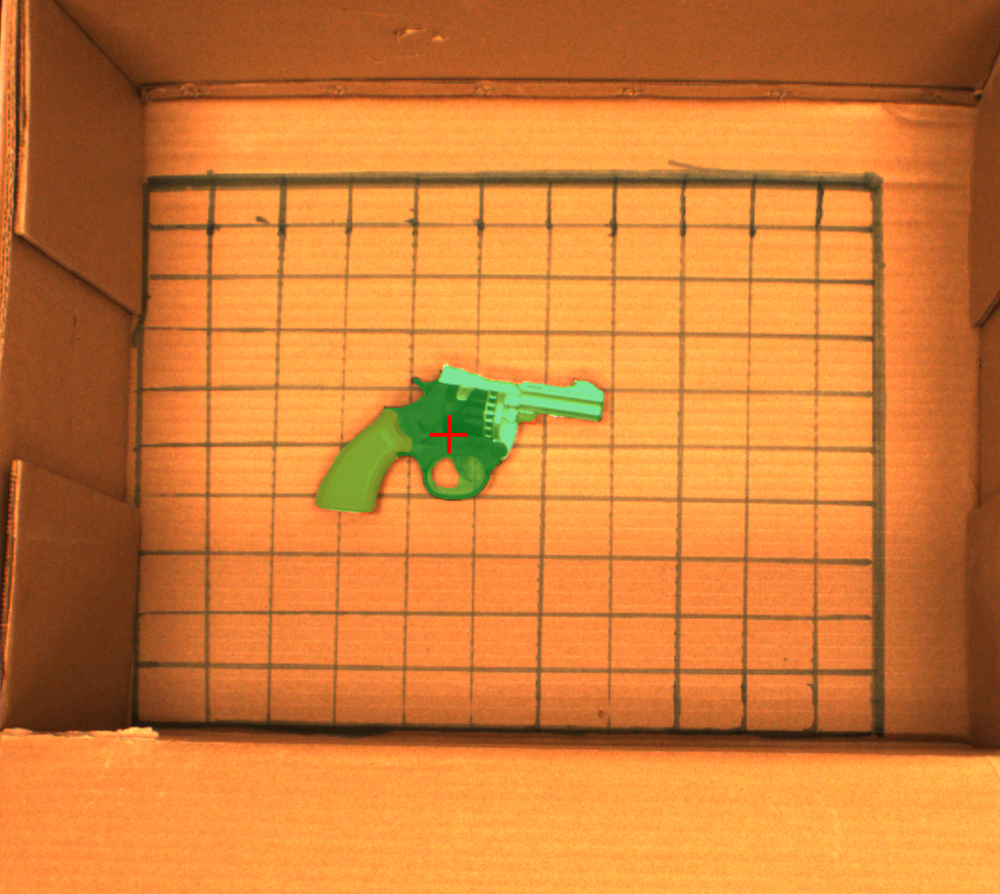

In [16]:
overlay_image = plot_overlay_image(cropped_image, overlay, x_pos, y_pos)
overlay_image

## All-in-one — 

Convenience cell to run the full pipeline in one shot.

In [ ]:
shifts, mask, data = process_sample(
    sample_path, left=LEFT, right=RIGHT, up=UP, down=DOWN, object=OBJECT
)
data["overlay_image"]